# **Abhishek Bhardwaj**
### Assignment-4
Consider the dataset available in the attached link.Dataset has following key features:
reviewer_id:
store_name:
category:
store_address:
latitude:
longitude:
rating_count:
review_time:
review:
rating:
Perform sentiment analysis on the given dataset.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk

In [4]:
!python -m spacy download en_core_web_lg

2023-08-16 13:54:54.580544: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 1.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [5]:
import spacy
nlp = spacy.load("en_core_web_lg")

In [6]:
from google.colab import files
files.upload()

Saving McDonald_s_Reviews.csv to McDonald_s_Reviews.csv


{'McDonald_s_Reviews.csv': b'reviewer_id,store_name,category,store_address,latitude ,longitude,rating_count,review_time,review,rating\r\n1,McDonald\'s,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.4607176,-97.7928744,"1,240",3 months ago,"Why does it look like someone spit on my food?\nI had a normal transaction,  everyone was chill and polite, but now i dont want to eat this. Im trying not to think about what this milky white/clear substance is all over my food, i d*** sure am not coming back.",1 star\r\n2,McDonald\'s,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.4607176,-97.7928744,"1,240",5 days ago,"It\'d McDonalds. It is what it is as far as the food and atmosphere go. The staff here does make a difference. They are all friendly, accommodating and always smiling. Makes for a more pleasant experience than many other fast food places.",4 stars\r\n3,McDonald\'s,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United

In [7]:
df=pd.read_csv('McDonald_s_Reviews.csv',encoding="latin-1")

In [8]:
df.head()

,reviewer_id,store_name,category,store_address,latitude,longitude,rating_count,review_time,review,rating
0,1,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",3 months ago,Why does it look like someone spit on my food?...,1 star
1,2,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",5 days ago,It'd McDonalds. It is what it is as far as the...,4 stars
2,3,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",5 days ago,Made a mobile order got to the speaker and che...,1 star
3,4,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",a month ago,My mc. Crispy chicken sandwich was ï¿½ï¿½ï¿½ï¿...,5 stars
4,5,McDonald's,Fast food restaurant,"13749 US-183 Hwy, Austin, TX 78750, United States",30.460718,-97.792874,"1,240",2 months ago,"I repeat my order 3 times in the drive thru, a...",1 star


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33396 entries, 0 to 33395
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   reviewer_id    33396 non-null  int64  
 1   store_name     33396 non-null  object 
 2   category       33396 non-null  object 
 3   store_address  33396 non-null  object 
 4   latitude       32736 non-null  float64
 5   longitude      32736 non-null  float64
 6   rating_count   33396 non-null  object 
 7   review_time    33396 non-null  object 
 8   review         33396 non-null  object 
 9   rating         33396 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 2.5+ MB


In [10]:
df['rating_count'].unique()

array(['1,240', '1,028', '2,193', '2,052', '1,670', '5,186', '1,542',
       '2,251', '2,348', '550', '3,196', '3,902', '1,562', '1,861',
       '3,243', '1,269', '263', '2,614', '4,922', '1,159', '1,306',
       '2,722', '3,380', '19,671', '1,460', '1,454', '1,406', '1,795',
       '933', '998', '1,564', '957', '2,365', '2,175', '5,566', '1,617',
       '5,466', '595', '2,657', '2,808', '1,307', '3,381', '19,682',
       '1,794', '999', '1,565', '5,567', '1,618', '5,468', '2,658',
       '2,810'], dtype=object)

In [11]:
df['rating_count']=pd.to_numeric(df['rating_count'].str.replace(",",""))

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33396 entries, 0 to 33395
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   reviewer_id    33396 non-null  int64  
 1   store_name     33396 non-null  object 
 2   category       33396 non-null  object 
 3   store_address  33396 non-null  object 
 4   latitude       32736 non-null  float64
 5   longitude      32736 non-null  float64
 6   rating_count   33396 non-null  int64  
 7   review_time    33396 non-null  object 
 8   review         33396 non-null  object 
 9   rating         33396 non-null  object 
dtypes: float64(2), int64(2), object(6)
memory usage: 2.5+ MB


In [13]:
df['rating']

0         1 star
1        4 stars
2         1 star
3        5 stars
4         1 star
          ...   
33391     1 star
33392    5 stars
33393    4 stars
33394    5 stars
33395    5 stars
Name: rating, Length: 33396, dtype: object

In [14]:
df['rating']=df['rating'].apply(lambda x : x.split()[0])

In [15]:
df['rating']=df['rating'].astype('int64')

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33396 entries, 0 to 33395
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   reviewer_id    33396 non-null  int64  
 1   store_name     33396 non-null  object 
 2   category       33396 non-null  object 
 3   store_address  33396 non-null  object 
 4   latitude       32736 non-null  float64
 5   longitude      32736 non-null  float64
 6   rating_count   33396 non-null  int64  
 7   review_time    33396 non-null  object 
 8   review         33396 non-null  object 
 9   rating         33396 non-null  int64  
dtypes: float64(2), int64(3), object(5)
memory usage: 2.5+ MB


In [17]:
df.isnull().sum()

reviewer_id        0
store_name         0
category           0
store_address      0
latitude         660
longitude        660
rating_count       0
review_time        0
review             0
rating             0
dtype: int64

<Axes: >

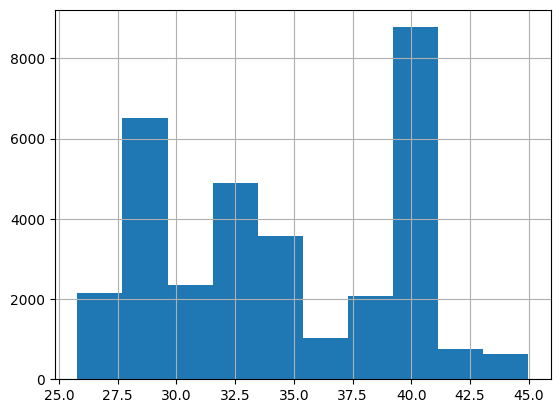

In [18]:
df['latitude '].hist()

<Axes: >

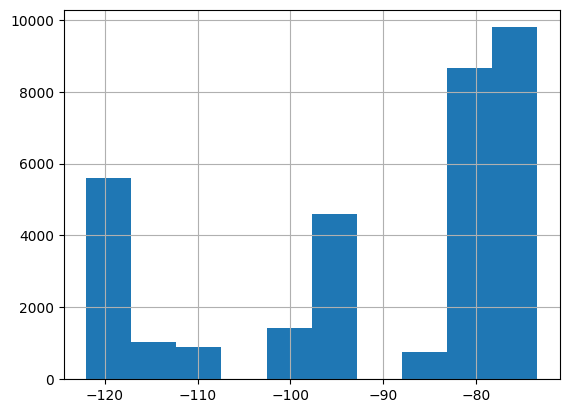

In [19]:
df['longitude'].hist()

In [20]:
df['latitude ']=df['latitude '].fillna(df['latitude '].mode()[0])

In [21]:
df['longitude']=df['longitude'].fillna(df['longitude'].mode()[0])

In [22]:
df.isnull().sum()

reviewer_id      0
store_name       0
category         0
store_address    0
latitude         0
longitude        0
rating_count     0
review_time      0
review           0
rating           0
dtype: int64

In [23]:
df.drop(['reviewer_id','store_name','category','store_address','rating_count'],inplace=True,axis=1)

In [24]:
df.head()

,latitude,longitude,review_time,review,rating
0,30.460718,-97.792874,3 months ago,Why does it look like someone spit on my food?...,1
1,30.460718,-97.792874,5 days ago,It'd McDonalds. It is what it is as far as the...,4
2,30.460718,-97.792874,5 days ago,Made a mobile order got to the speaker and che...,1
3,30.460718,-97.792874,a month ago,My mc. Crispy chicken sandwich was ï¿½ï¿½ï¿½ï¿...,5
4,30.460718,-97.792874,2 months ago,"I repeat my order 3 times in the drive thru, a...",1


<Axes: >

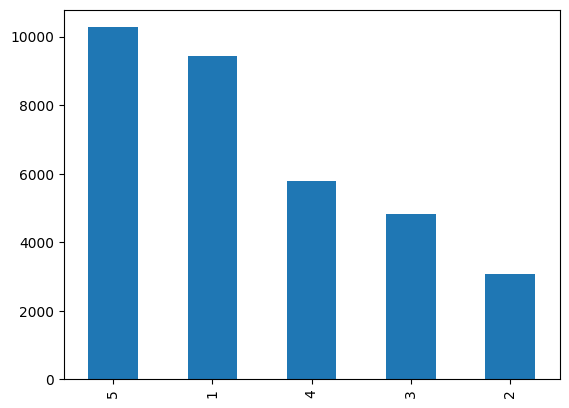

In [25]:
df['rating'].value_counts().plot(kind='bar')

In [26]:
import re
def text_clean(text):
    text=re.sub(r'[^a-zA-Z\s]',"",text.lower())
    tokens=text.split()
    tokens=[token for token in tokens if not token.isdigit()]
    tokens=[re.sub(r'[^\w\s]',"",token) for token in tokens]
    tokens=[token.strip() for token in tokens]
    cleaned_text=" ".join(tokens)
    return cleaned_text

In [27]:
df['cleaned_text']=[text_clean(text) for text in df['review']]
df.head()

,latitude,longitude,review_time,review,rating,cleaned_text
0,30.460718,-97.792874,3 months ago,Why does it look like someone spit on my food?...,1,why does it look like someone spit on my food ...
1,30.460718,-97.792874,5 days ago,It'd McDonalds. It is what it is as far as the...,4,itd mcdonalds it is what it is as far as the f...
2,30.460718,-97.792874,5 days ago,Made a mobile order got to the speaker and che...,1,made a mobile order got to the speaker and che...
3,30.460718,-97.792874,a month ago,My mc. Crispy chicken sandwich was ï¿½ï¿½ï¿½ï¿...,5,my mc crispy chicken sandwich was customer ser...
4,30.460718,-97.792874,2 months ago,"I repeat my order 3 times in the drive thru, a...",1,i repeat my order times in the drive thru and ...


In [28]:
#use this utility function to preprocess the text
#1. Remove the stop words
#2. Convert to base form using lemmatisation


def preprocess(text):
    doc = nlp(text)
    filtered_tokens = []
    for token in doc:
        if token.is_stop or token.is_punct:
            continue
        filtered_tokens.append(token.lemma_)
    return ' '.join(filtered_tokens)

In [29]:
#create a new column "preprocessed_text" which store the clean form of given text [use apply and lambda function]

df['preprocessed_text'] = df['cleaned_text'].apply(lambda text: preprocess(text))

In [30]:
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [31]:
sia=SentimentIntensityAnalyzer()

In [33]:
sentiments = []
for review in df['review']:
    sentiment = sia.polarity_scores(review)
    sentiments.append(sentiment)

In [34]:
sentiment_labels = []

for sentiment in sentiments:
    compound_score = sentiment['compound']
    if compound_score >= 0.05:
        sentiment_labels.append('Positive')
    elif compound_score <= -0.05:
        sentiment_labels.append('Negative')
    else:
        sentiment_labels.append('Neutral')

In [35]:
df['sentiment'] = sentiment_labels
df[['review', 'sentiment']]

,review,sentiment
0,Why does it look like someone spit on my food?...,Positive
1,It'd McDonalds. It is what it is as far as the...,Positive
2,Made a mobile order got to the speaker and che...,Negative
3,My mc. Crispy chicken sandwich was ï¿½ï¿½ï¿½ï¿...,Neutral
4,"I repeat my order 3 times in the drive thru, a...",Negative
...,...,...
33391,They treated me very badly.,Negative
33392,The service is very good,Positive
33393,To remove hunger is enough,Negative
33394,"It's good, but lately it has become very expen...",Positive


# Train-Test Split

In [36]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

In [37]:
X = df['review']
y = df['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

In [38]:
v = TfidfVectorizer()
X_train = v.fit_transform(X_train)
X_test = v.transform(X_test)

In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Logistic Regression

In [42]:

model1=LogisticRegression(max_iter=400)
model1.fit(X_train,y_train)
y_pred = model1.predict(X_test)
print("Accuracy : ",accuracy_score(y_test,y_pred))

Accuracy :  0.8833832335329341


# **Multinomial Naive Bayes**

In [43]:
model2=MultinomialNB()
model2.fit(X_train,y_train)
y_pred = model2.predict(X_test)
print("Accuracy : ",accuracy_score(y_test,y_pred))

Accuracy :  0.7480538922155688


# SVM

In [44]:
model3=SVC()
model3.fit(X_train,y_train)
y_pred = model3.predict(X_test)
print("Accuracy : ",accuracy_score(y_test,y_pred))

Accuracy :  0.8917664670658683


# Random Forest

In [46]:
model4=RandomForestClassifier()
model4.fit(X_train,y_train)
y_pred = model4.predict(X_test)
print("Accuracy : ",accuracy_score(y_test,y_pred))

Accuracy :  0.8808383233532934


SVM gives better accuracy compared to other models.

# **Testing**

In [47]:
def predict_sentiment(review):
    review_tfidf = v.transform([review])
    sentiment = model3.predict(review_tfidf)
    return sentiment[0]

In [50]:
new_review = "This restaurant provide a very good service."
predicted_sentiment = predict_sentiment(new_review)
print("Predicted sentiment:", predicted_sentiment)

Predicted sentiment: Positive


In [51]:
new_review = "The food is not so good."
predicted_sentiment = predict_sentiment(new_review)
print("Predicted sentiment:", predicted_sentiment)

Predicted sentiment: Negative
